In [4]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import pickle
%matplotlib inline

### Sobel functions sobel_thresh and sobel_grad

sobel_thresh function set up to allow application on 

In [2]:
'''
sobel_thresh
input: single plane image
choice to apply sobel in x, y or both and using different derivative or filter kernel size
'''
# enum flags to select which operations to apply 
X_DIR = 1
Y_DIR = 2
MAGNITUDE = 4+2+1
ANGLE = 8+2+1

def sobel_thresh(img, orient=X_DIR, thresh_min=0, thresh_max=255, ksize=3, deriv=1):
    if img.ndim != 2:
        print("Error in sobel_thresh: img is supposed to have 2 dimensions, but has {} dimensions".format(img.ndim))
        return False, np.array([0])
    X_DIR = 1
    Y_DIR = 2
    MAGNITUDE = 4+2+1
    ANGLE = 8+2+1 
    
        
    # Take the derivative in x or y
    if orient & X_DIR == X_DIR:
        sobel = cv2.Sobel(img, cv2.CV_64F, 1*deriv, 0, ksize=ksize)
        #3) Take the absolute value of the derivative or gradient
        abs_sobelx = np.absolute(sobel)
        abs_sobel = abs_sobelx
    if orient & Y_DIR == Y_DIR:
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1*deriv, ksize=ksize)
        #Take the absolute value of the derivative or gradient
        abs_sobely = np.absolute(sobel)
        abs_sobel = abs_sobely

    #calculate magnitude or angle and scale output to range 0-255
    if orient == MAGNITUDE:
        magnitude = np.sqrt(abs_sobelx**2 + abs_sobely**2)
        # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobel = np.uint8(255*magnitude/np.max(magnitude))
    elif orient == ANGLE:
        angle = np.arctan2(abs_sobely, abs_sobelx)
        # scale to pi/2 = 255 - the direction is important
        print("Min Angular value is {} and Max value is {}.".format(np.min(angle/np.pi),np.max(angle/np.pi)))
        scaled_sobel = np.uint8(255*angle/(np.pi/2))
    else:      
        # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
        
    # 5) Create a mask of 1's where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max   
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    # 6) Return this mask as your binary_output image
    return True, sbinary

'''
experimental function to find lines
second derivative down lines (generally in y direction should be close to zero)

'''
#def sobel_grad(img, ksize=3, deriv=1):
def sobel_grad(img, ksize=(5,3), deriv=(1,2)):
    sobelx = cv2.Sobel(img, cv2.CV_64F, deriv[0], 0, ksize=ksize[0])
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, deriv[1], ksize=ksize[1])
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    angle = np.arctan2(sobely, sobelx)
    sobel = np.dstack((np.zeros_like(sobelx),magnitude, angle))
    return sobel
#    return magnitude

### Code to automate testing threshold ranges of specific channels

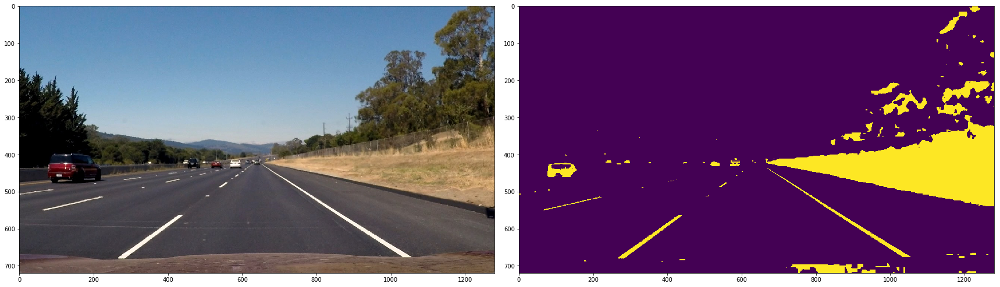

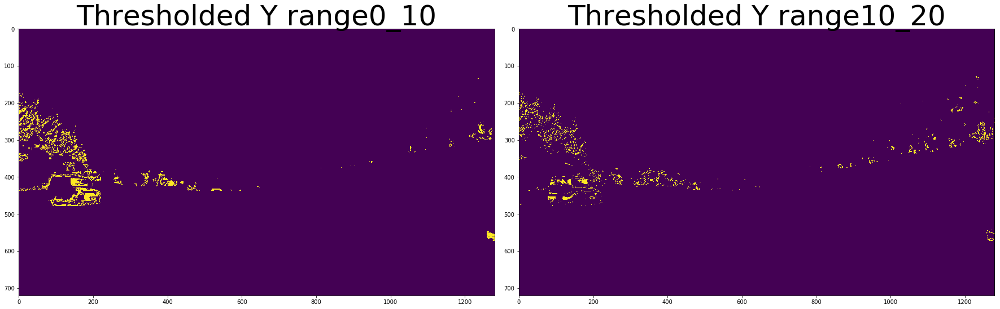

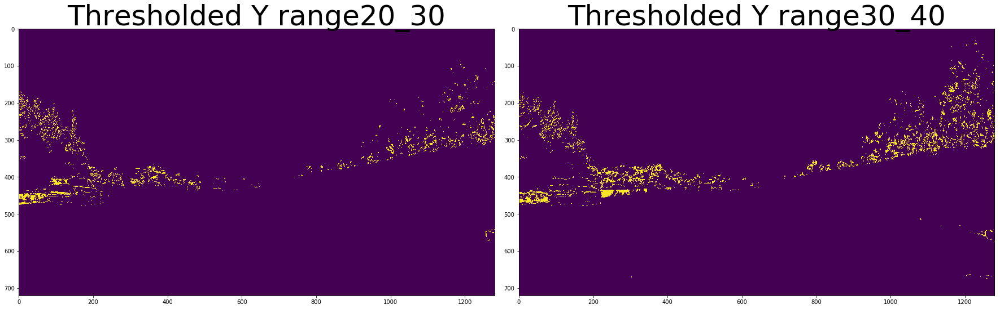

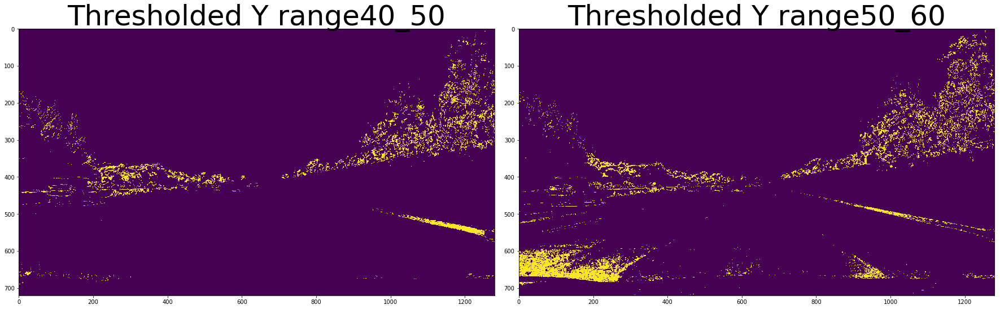

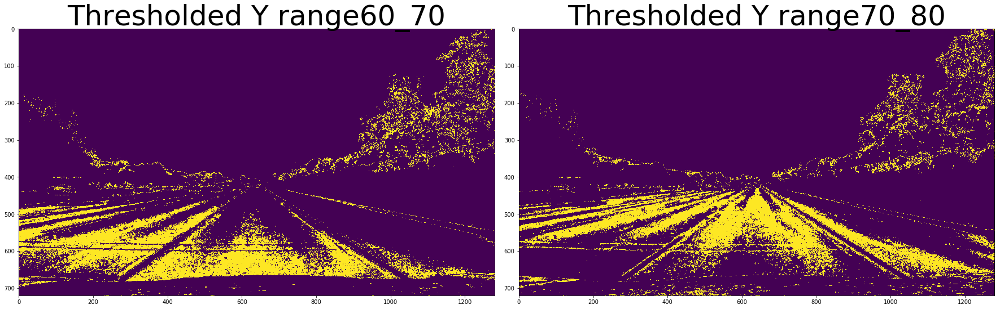

...

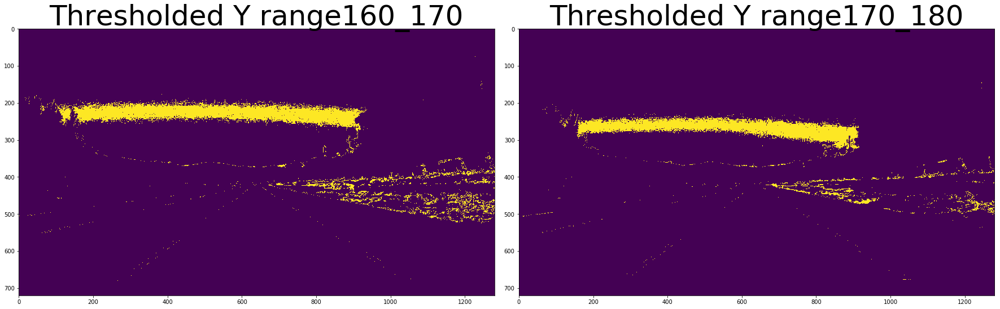

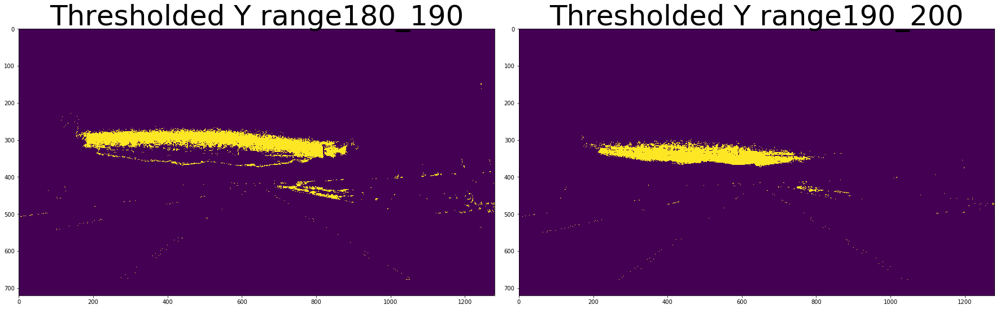

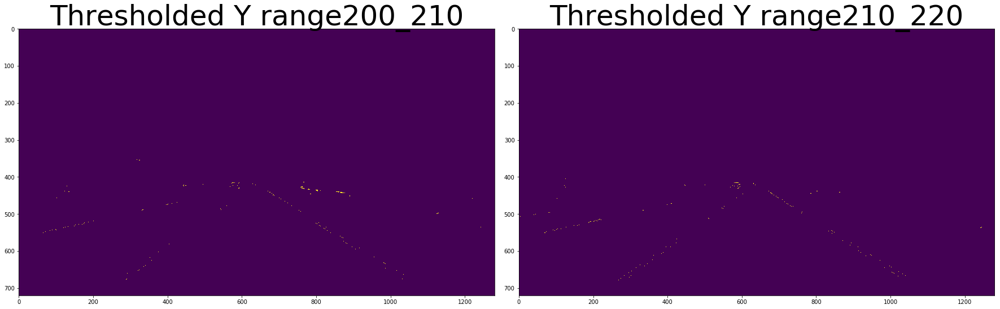

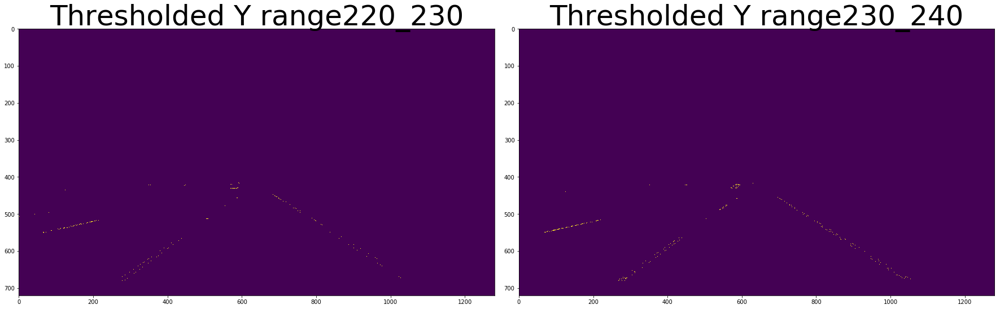

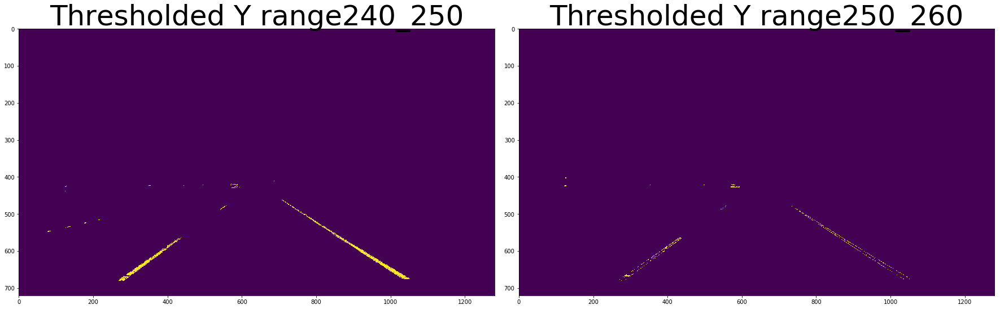

In [5]:
import numpy as np
import cv2
import matplotlib.pyplot as plt



# signs_vehicles_xygrad.png
# straight_lines1.jpg
image = cv2.imread('./test_images/straight_lines2.jpg')
imageRGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 

image_YCC = cv2.cvtColor(image, cv2.COLOR_BGR2YCR_CB)
Y = image_YCC[:,:,0]
CR = image_YCC[:,:,1]
CB = image_YCC[:,:,2]

thresh_Y = np.zeros_like(Y)
thresh_CR = np.zeros_like(Y)
thresh_CB = np.zeros_like(Y)



thresh_Y[(Y>200) | ((CR>142)&(CR<170)) | ((CB>30)&(CB<110))] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax2.imshow(thresh_Y)
ax1.imshow(imageRGB)



bottom = 0
top =  np.max(Y)
step = 10 #int((top - bottom)/20)
for low in range(bottom,top,step*2):
    img_thresh = np.zeros_like(Y)
    img_thresh[(Y>low) & (Y<=(low+step))]=1
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img_thresh)
    ax1.set_title('Thresholded Y range'+str(low)+'_'+str(low+step), fontsize=50)
    img_thresh = np.zeros_like(Y)
    img_thresh[(Y>(low+step)) & (Y<=(low+step*2))]=1
    ax2.imshow(img_thresh)
    ax2.set_title('Thresholded Y range'+str(low+step)+'_'+str(low+step*2), fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


### Code cell used to show application of identified thresholds

Min Angular value is 0.0 and Max value is 0.5.


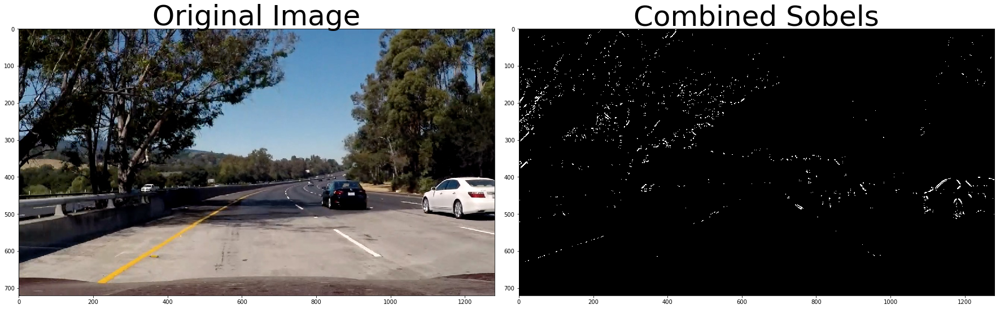

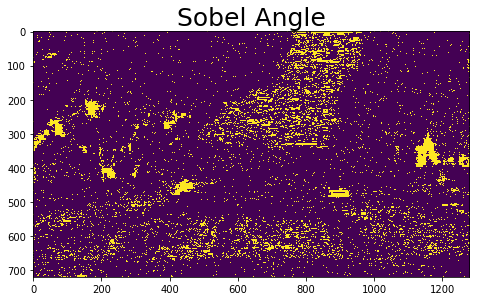

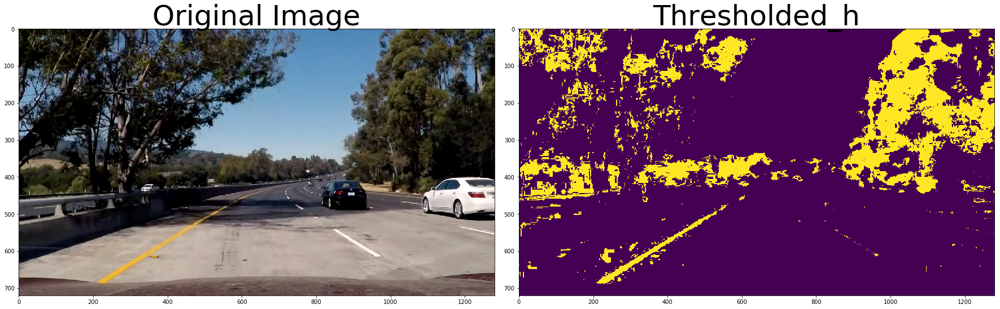

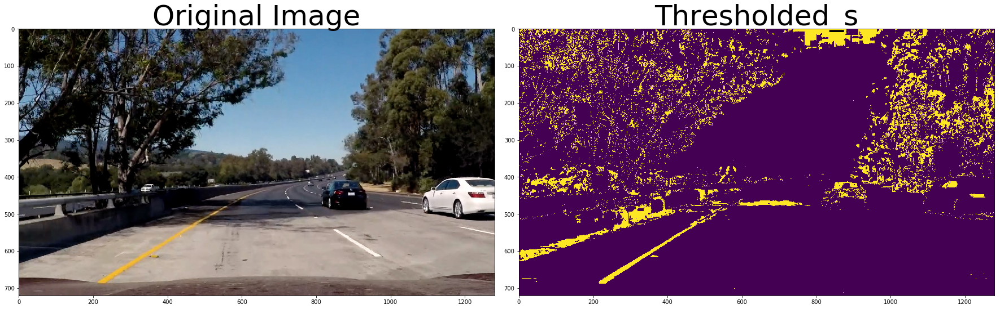

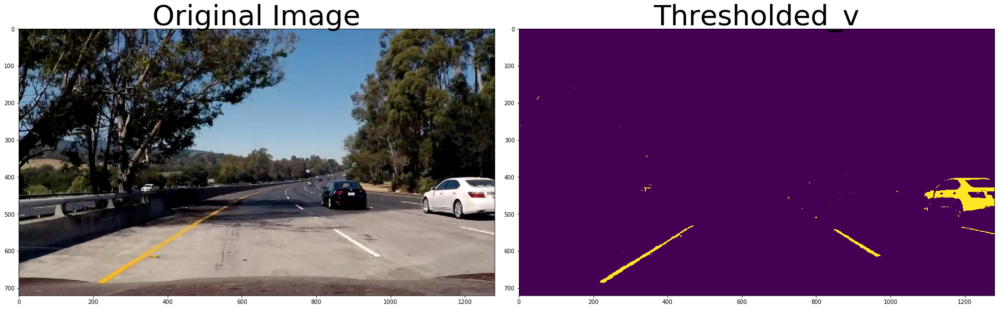

...

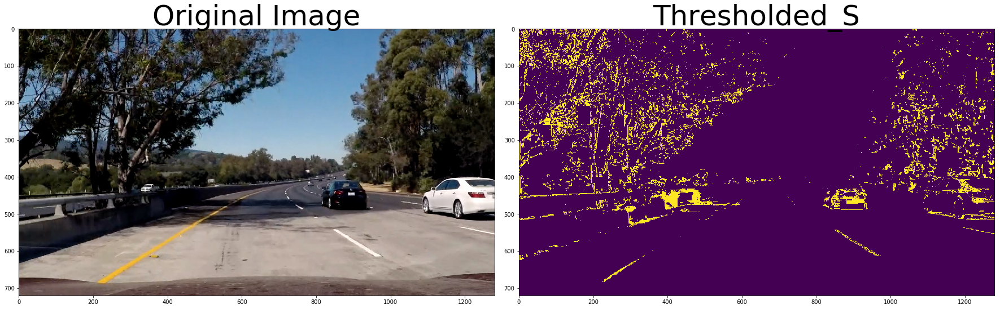

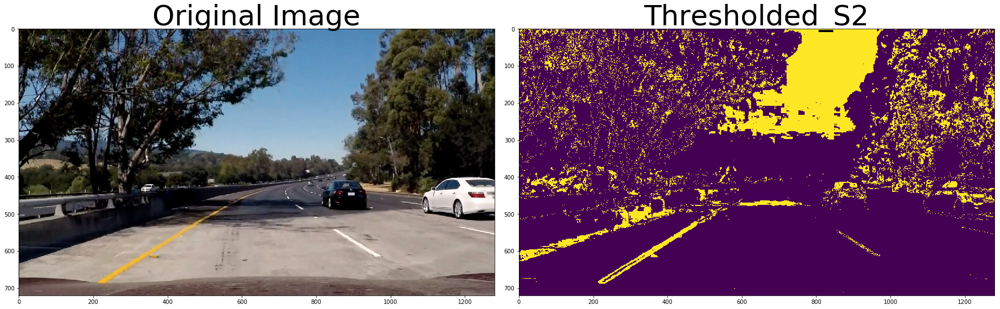

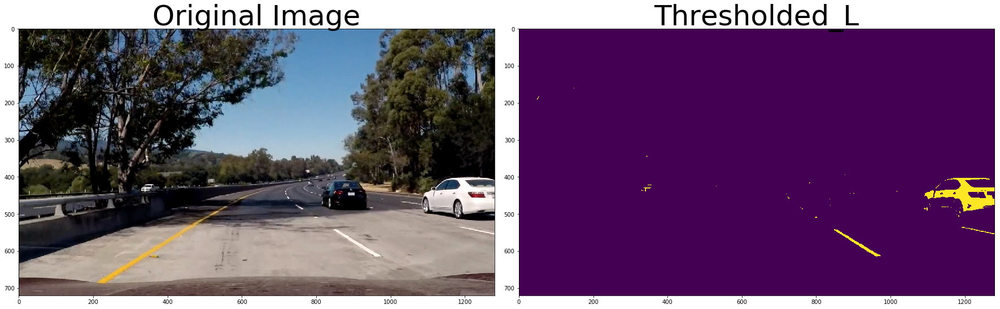

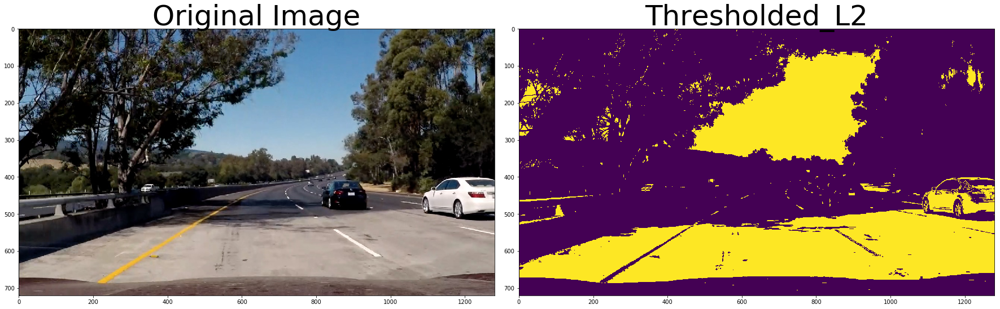

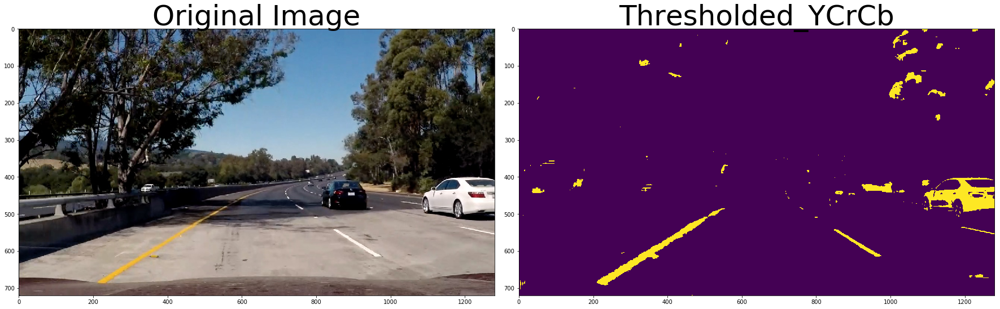

In [16]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# signs_vehicles_xygrad.png
# straight_lines1.jpg
image = cv2.imread('./test_images/test5.jpg')
imageRGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 

# Run the function
#for min_threshold in range(0 ,10, 10):
#    for max_threshold in range(20, 250, 40):
#        for ksize in range(3,9,2):
image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
h,s,v = cv2.split(image_hsv)

image_hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
H = image_hls[:,:,0]
L = image_hls[:,:,1]
S = image_hls[:,:,2]

img_YCC = cv2.cvtColor(image, cv2.COLOR_BGR2YCR_CB)
Y = img_YCC[:,:,0]
CR = img_YCC[:,:,1]
CB = img_YCC[:,:,2]


inp = v
ret, x_binary = sobel_thresh(inp, orient=X_DIR, thresh_min=50, thresh_max=255,ksize=7)
ret, y_binary = sobel_thresh(inp, orient=Y_DIR, thresh_min=50, thresh_max=255,ksize=7)
ret, grad_binary = sobel_thresh(inp, orient=ANGLE, thresh_min=0, thresh_max=0.01,ksize=3, deriv=2)
ret, mag_binary = sobel_thresh(inp, orient=MAGNITUDE, thresh_min=128, thresh_max=250,ksize=7)
outp = np.zeros_like(inp)
outp[((x_binary == 1) & (y_binary == 1)) | ((grad_binary==1)&(mag_binary==1))] = 1

#grad_binary = abs_sobel_thresh(image, orient=ANGLE, thresh_min=min_threshold, thresh_max=max_threshold,ksize=ksize)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(imageRGB)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(outp, cmap='gray')
ax2.set_title('Combined Sobels', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f, ax = plt.subplots(1, 1, figsize=(12, 4))
f.tight_layout()
ax.set_title('Sobel Angle', fontsize=25)
ax.imshow(grad_binary)


thresh_h = np.zeros_like(inp)
thresh_s = np.zeros_like(inp)
thresh_v = np.zeros_like(inp)
thresh_H = np.zeros_like(inp)
thresh_S = np.zeros_like(inp)
thresh_S2 = np.zeros_like(inp)
thresh_L = np.zeros_like(inp)
thresh_L2 = np.zeros_like(inp)
thresh_Y = np.zeros_like(inp)


thresh_h[(h>17) & (h<=(31))]=1
thresh_s[(s>140) & (s<=(240))]=1
thresh_v[(v>225)]=1
thresh_H[(H>14) & (H<=(30))]=1
thresh_S[(S>220)]=1
thresh_S2[(S>100)&(S<220)]=1
thresh_L[(L>220)]=1
thresh_L2[(L>140)&(S<180)]=1
thresh_Y[(Y>200) | ((CR>142)&(CR<170)) | ((CB>30)&(CB<110))] = 1


pics =[thresh_h, thresh_s, thresh_v, thresh_H, thresh_S, thresh_S2, thresh_L, thresh_L2, thresh_Y]
names =["h","s","v","H","S","S2","L","L2","YCrCb"]
for pic,name in zip(pics,names):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(imageRGB)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(pic)
    ax2.set_title('Thresholded_'+name, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    
# f, ax = plt.subplots(1, 1, figsize=(24, 18))
# ax.imshow(imageRGB);
#bottom = 140
#top =  np.max(H)
#step = 10#int((top - bottom)/20)
#for low in range(bottom,top,step*2):
#    img_thresh = np.zeros_like(inp)
#    img_thresh[(H>low) & (H<=(low+step))]=1
#    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#    f.tight_layout()
#    ax1.imshow(img_thresh)
#    ax1.set_title('Thresholded H range'+str(low)+'_'+str(low+step), fontsize=50)
#    img_thresh = np.zeros_like(inp)
#    img_thresh[(H>(low+step)) & (H<=(low+step*2))]=1
#    ax2.imshow(img_thresh)
#    ax2.set_title('Thresholded H range'+str(low+step)+'_'+str(low+step*2), fontsize=50)
#    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Code cells to transform from dashcam view to birdseye

In [7]:
import pickle
%matplotlib inline

'''
information needed for undistort
'''
dist_pickle = pickle.load( open( "./camera_cal/cal_dist_pickle.p", "rb" ) )
undistort_mtx = dist_pickle["mtx"]
undistort_dist = dist_pickle["dist"]

'''
func: undistort
removes intrinsic camera distortion effects
leaves black in frame (does not crop) outside visible edges of corrrected image
'''
def undistort(img):  
    # Use the OpenCV undistort() function to remove distortion
    h,  w = img.shape[:2]
    new_mtx, roi=cv2.getOptimalNewCameraMatrix(undistort_mtx,undistort_dist,(w,h),1,(w,h))
    undist = cv2.undistort(img, undistort_mtx, undistort_dist, None, new_mtx)
    return undist

'''
information needed for birdseye_transform 
'''

birdseye_src = np.float32([[617, 450],
                           [711, 450], 
                           [988, 626], 
                           [359, 626]])

birdseye_dst = np.float32([[260, 640],
                           [460, 640], 
                           [460,1260], 
                           [260,1260]])   
'''
func: birdseye_transform()
transform image from perspective view to overhead (birdseye) view
'''
def birdseye_transform(img):
    # Given src and dst points, calculate the perspective transform matrix
    birdseye_M = cv2.getPerspectiveTransform(birdseye_src, birdseye_dst)
    #img_size = (img.shape[1],img.shape[0])
    # we're switching the display aspect to be more useful
    img_size =(720,1280)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, birdseye_M, img_size)
    return warped

def birdseye_untransform(img):
    # Given src and dst points, calculate the perspective transform matrix
    birdseye_M_inv = cv2.getPerspectiveTransform(birdseye_dst, birdseye_src)
    #img_size = (img.shape[1],img.shape[0])
    # switch the display aspect back
    img_size =(1280,720)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, birdseye_M_inv, img_size)
    return warped

undistort_src = np.float32([[59,63],
                           [1244, 63], 
                           [1244, 673], 
                           [59, 673]])

undistort_dst = np.float32([[0, 0],
                           [1279, 0], 
                           [1279,719], 
                           [0,719]])
def undistort_crop(img):
    # Given src and dst points, calculate the perspective transform matrix
    undistort_M = cv2.getPerspectiveTransform(undistort_src, undistort_dst)
    img_size =(1280,720)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, undistort_M, img_size)
    return warped


### Code cells to visualize application of thresholds to birdseye view images

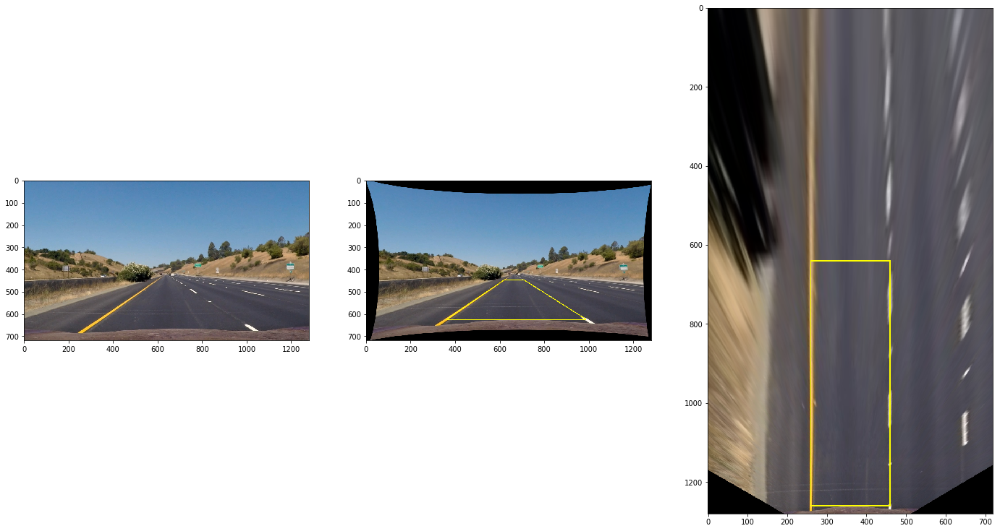

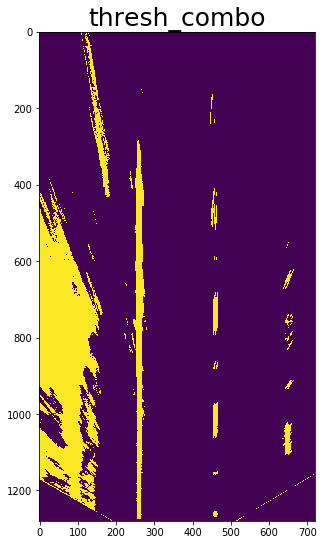

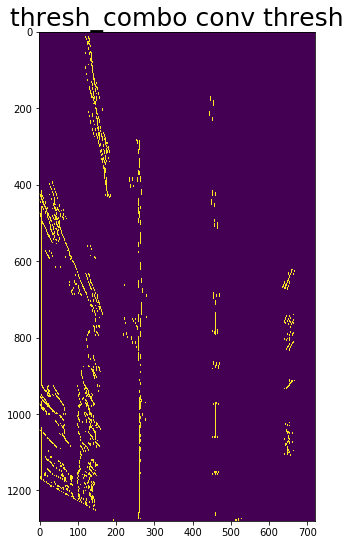

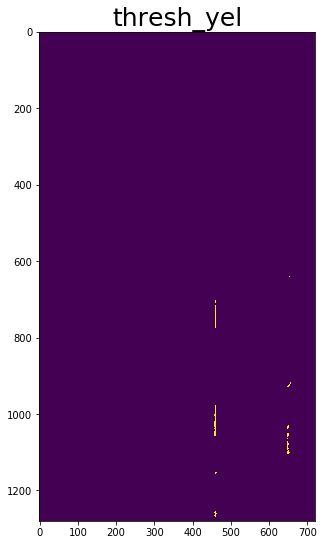

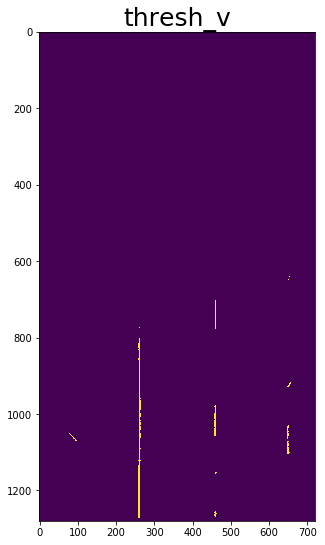

...

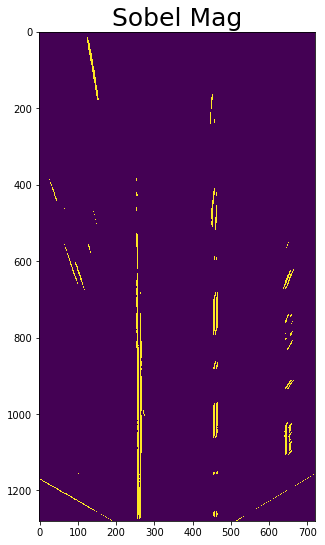

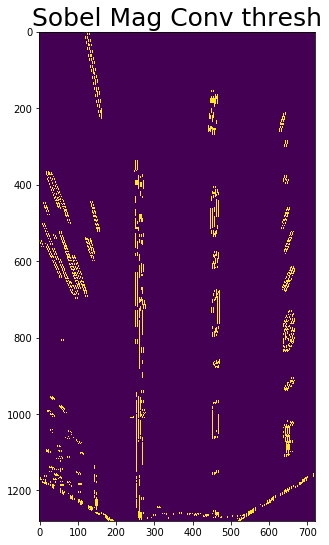

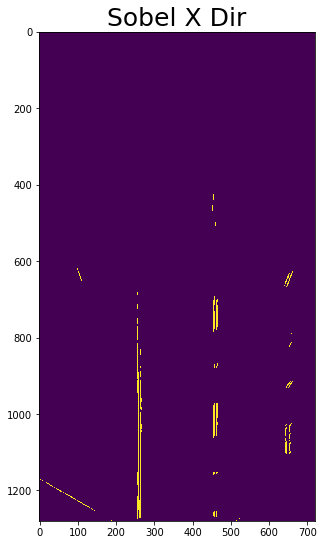

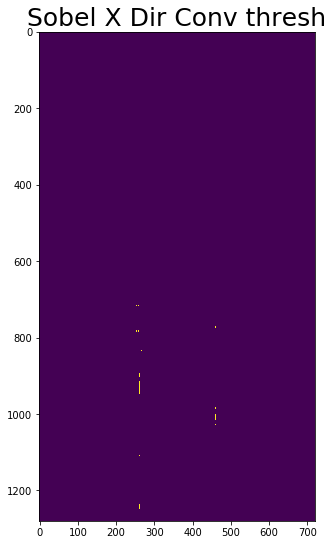

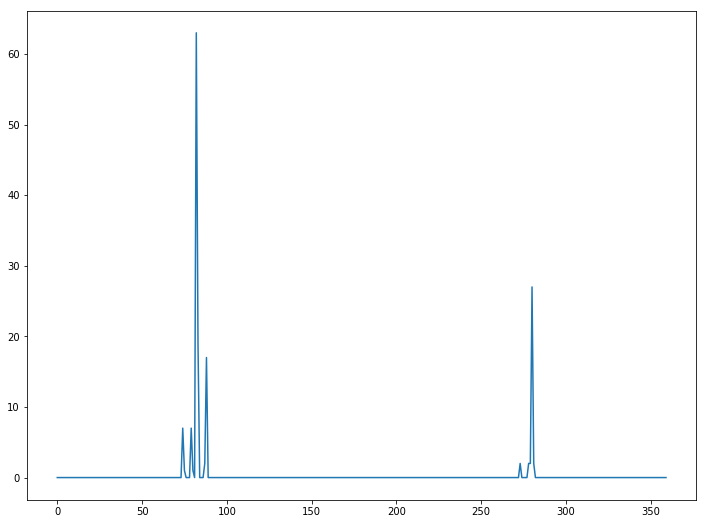

In [11]:
import scipy.signal
image = cv2.imread('./test_images/straight_lines1.jpg')
#image = cv2.imread('./test_images/test5.jpg')
imageRGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Apply the fix for camera distortion
true_image = undistort(image)
true_imageRGB = cv2.cvtColor(true_image, cv2.COLOR_BGR2RGB)
cv2.polylines(true_imageRGB, [np.int32(birdseye_src)], True, (255,255,0), 2)
#put the display image back to BGR to save.
true_imageBGR = cv2.cvtColor(true_imageRGB, cv2.COLOR_RGB2BGR)
#cv2.imwrite('./output_images/undistorted_andpoly_straight_lines1.png', true_imageBGR)

croptrue_imageBGR = undistort_crop(true_imageBGR)
#cv2.imwrite('./output_images/crop_undist_straight_lines1.png', croptrue_imageBGR)


# Transform the image to view from above(birdseye)
birdseye_image = birdseye_transform(true_image)
birdseye_imageRGB = cv2.cvtColor(birdseye_image, cv2.COLOR_BGR2RGB)
cv2.polylines(birdseye_imageRGB, [np.int32(birdseye_dst)], True, (255,255,0), 2)
#put the display image back to BGR to save.
birdseye_imageBGR = cv2.cvtColor(birdseye_imageRGB, cv2.COLOR_RGB2BGR)
#cv2.imwrite('./output_images/birdseye_straight_lines1.png', birdseye_imageBGR)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 18))
ax1.imshow(imageRGB)
ax2.imshow(true_imageRGB)
ax3.imshow(birdseye_imageRGB)

b = birdseye_image[:,:,0]
g = birdseye_image[:,:,1]
r = birdseye_image[:,:,2]

image_hsv = cv2.cvtColor(birdseye_image, cv2.COLOR_BGR2HSV)
#h,s,v = cv2.split(image_hsv)
h = image_hsv[:,:,0]
s = image_hsv[:,:,1]
v = image_hsv[:,:,2]

image_hls = cv2.cvtColor(birdseye_image, cv2.COLOR_BGR2HLS)
H = image_hls[:,:,0]
L = image_hls[:,:,1]
S = image_hls[:,:,2]

img_YCC = cv2.cvtColor(birdseye_image, cv2.COLOR_BGR2YCR_CB)
Y = img_YCC[:,:,0]
CR = img_YCC[:,:,1]
CB = img_YCC[:,:,2]

sgrad_img = sobel_grad(v)
sobel_mag_v = sgrad_img[:,:,1]
thresh_sobel_mag_v = np.zeros_like(sobel_mag_v, dtype=np.uint8)
thresh_sobel_mag_v[(sobel_mag_v>1750)] = 255
thresh_combo = np.zeros_like(sobel_mag_v)
thresh_combo[
                        (thresh_sobel_mag_v>0) |
                        (v>220)|
                        ((h>=19) &(h<=24))|
                        #((H>17)&(H<45)&(L>140)&(L<180)&(S>80))|
                        #(L > 220) |
                        #((s>140)&(s<220))|
                        (Y>200)|
                        ((CR>142)&(CR<170))|
                        ((CB>30)&(CB<110))
                        |((r>225)&(g>180)&(b<170))
                        ]=1 


f, ax = plt.subplots(1, 1, figsize=(12, 9))
ax.imshow(thresh_combo)
ax.set_title('thresh_combo', fontsize=25)

kernel1 = np.array([[1,1,1],[1,1,1],[1,1,1]])

kernel2 = np.array([[0,-1,1,0,0,0,0,0,0,0,0,1,-1,0],
                    [0,-1,1,0,0,0,0,0,0,0,0,1,-1,0],
                    [0,-1,1,0,0,0,0,0,0,0,0,1,-1,0],
                    [0,-1,1,0,0,0,0,0,0,0,0,1,-1,0],
                    [0,-1,1,0,0,0,0,0,0,0,0,1,-1,0]])


kernel3 = np.array([[0,-1,2,-1,0,0,-1,2,-1,0],
                    [0,-1,2,-1,0,0,-1,2,-1,0],
                    [0,-1,2,-1,0,0,-1,2,-1,0],
                    [0,-1,2,-1,0,0,-1,2,-1,0],
                    [0,-1,2,-1,0,0,-1,2,-1,0]])

conv = scipy.signal.convolve2d(thresh_combo, kernel1, mode='same')
rc = np.zeros_like(conv, dtype = np.uint8)
rc[conv>6]=1

conv = scipy.signal.convolve2d(rc, kernel2, mode='same')
f, ax = plt.subplots(1, 1, figsize=(12, 9))
rc = np.zeros_like(conv, dtype = np.uint8)
rc[conv>0]=255
ax.imshow(rc);
ax.set_title('thresh_combo conv thresh', fontsize=25)
#cv2.imwrite('./output_images/combo_thresh_conv_straight_lines1.png',rc)

thresh_yel = np.zeros_like(v)
thresh_yel[(r>220)&(g>220)]=1
f, ax = plt.subplots(1, 1, figsize=(12, 9))
ax.set_title('thresh_yel', fontsize=25)
ax.imshow(thresh_yel);

thresh_v = np.zeros_like(v)
thresh_v[(v>220)]=1

thresh_vSL = np.zeros_like(v)
thresh_vSL[(v>225)|(L>220)|(S>190)|((h>17) & (h<=31))]=1

f, ax = plt.subplots(1, 1, figsize=(12, 9))
ax.imshow(thresh_v)
ax.set_title('thresh_v', fontsize=25)

kernel = np.ones((100,7),np.uint8)
kernel[:,0:1] = 0
kernel[:,5:6] = 0
#kernel = np.ones((100,4),np.uint8)
#conv = cv2.filter2D(thresh_v,-1,kernel)
conv = scipy.signal.convolve2d(thresh_v, kernel2, mode='same')
rc = np.zeros_like(conv)
rc[conv>3]=1
f, ax = plt.subplots(1, 1, figsize=(12, 9))
ax.set_title('thresh_v conv thresh', fontsize=25)
ax.imshow(rc);


conv = scipy.signal.convolve2d(thresh_combo, kernel1, mode='same')
f, ax = plt.subplots(1, 1, figsize=(12, 9))
rc = np.zeros_like(conv)
rc[conv>0]=255
ax.imshow(rc);
ax.set_title('thresh_combo conv thresh', fontsize=25)
#cv2.imwrite('./output_images/combo_thresh_straight_lines1.png',thresh_combo)

ret, mag_binary = sobel_thresh(v, orient=MAGNITUDE, thresh_min=32, thresh_max=255,ksize=5, deriv=1)
mag_binary = mag_binary * 255

f, ax = plt.subplots(1, 1, figsize=(12, 9))
ax.imshow(thresh_sobel_mag_v)
ax.set_title('Sobel Mag', fontsize=25)
#cv2.imwrite('./output_images/sobel_magv_straight_lines1.png',mag_binary)

#kernel = np.ones((100,4),np.uint8)#.float32)/400#
#conv_sobel = cv2.filter2D(x_binary,-1,kernel)
conv_sobel = scipy.signal.convolve2d(mag_binary, kernel3, mode='same')
rc = np.zeros_like(mag_binary)
rc[conv_sobel>6]=1
f, ax = plt.subplots(1, 1, figsize=(12, 9))
ax.imshow(rc);
ax.set_title('Sobel Mag Conv thresh', fontsize=25)

ret, x_binary = sobel_thresh(v, orient=X_DIR, thresh_min=75, thresh_max=255,ksize=5, deriv=1)
f, ax = plt.subplots(1, 1, figsize=(12, 9))
ax.imshow(x_binary)
ax.set_title('Sobel X Dir', fontsize=25)
x_binary1 = np.zeros_like(x_binary)
x_binary1[x_binary>=1]=255
#cv2.imwrite('./output_images/X_DIR.png', x_binary1)
#kernel = np.ones((100,5),np.uint8) #/500
#conv = cv2.filter2D(x_binary,-1,kernel2)
conv = scipy.signal.convolve2d(x_binary, kernel3, mode='same')
f, ax = plt.subplots(1, 1, figsize=(12, 9))
rc = np.zeros_like(x_binary)
rc[conv>8]=1
ax.imshow(rc);
ax.set_title('Sobel X Dir Conv thresh', fontsize=25)
#cv2.imwrite('./output_images/X_DIR_conv.png', conv)


#thresh_v = conv_sobel
f, ax = plt.subplots(1, 1, figsize=(12, 9))
histogram = np.sum(rc[rc.shape[0]//10:,180:540], axis=0)
#histogram = np.sum(rc[rc.shape[0]//2:,:], axis=0)
plt.plot(histogram);



### Test sobel_grad function

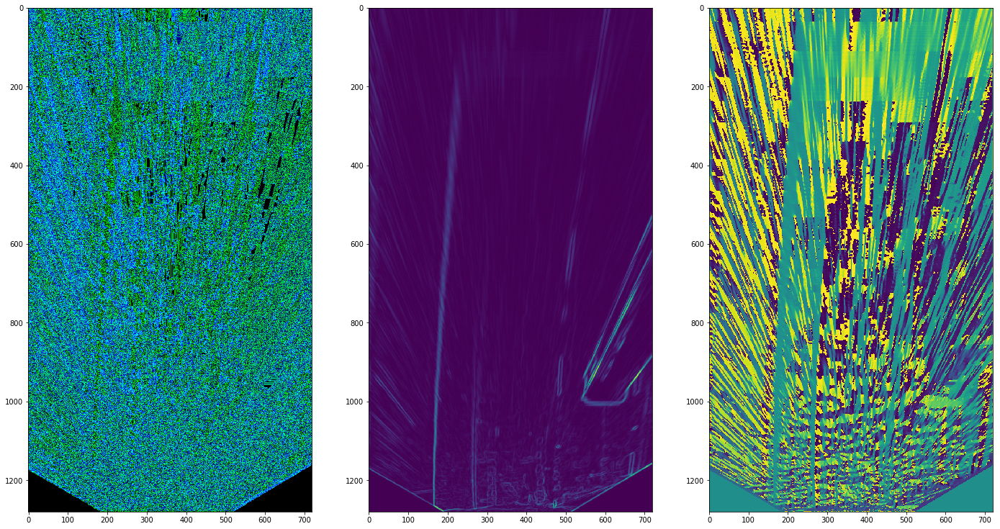

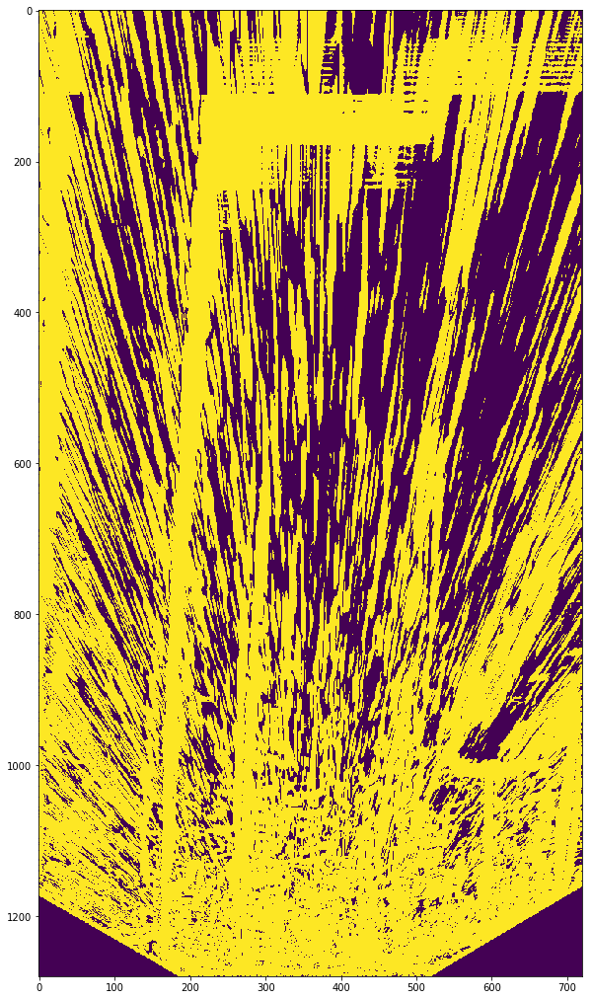

In [9]:
image = cv2.imread('./test_images/test1.jpg')
true_image = undistort(image)
birdseye_image = birdseye_transform(true_image)
image_hsv = cv2.cvtColor(birdseye_image, cv2.COLOR_BGR2HSV)
v = image_hsv[:,:,2]
#v = cv2.cvtColor(birdseye_image, cv2.COLOR_BGR2GRAY)
sobel_img = sobel_grad(v, ksize=(7,7), deriv=(1,1))
grad = sobel_img[:,:,1]
ang = sobel_img[:,:,2]
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 18))
ax1.imshow(sobel_img)
ax2.imshow(grad)
ax3.imshow(ang)
f, ax = plt.subplots(1, 1, figsize=(24, 18))
ang2 = np.zeros_like(ang)
ang2[ (grad>1000)]=1 #(abs(ang)<0.000001) &
ax.imshow(ang2);